In [1]:
import os
from collections import Counter

import cv2
import matplotlib.pyplot as plt
import numpy as np

from ImageContrastEnhancement import ImageContrastEnhancement

In [2]:
WORKING_PATH = os.getcwd()
IMAGES_PATH = os.path.join(WORKING_PATH, "Images")


In [3]:
images_paths = []
for path in os.listdir(IMAGES_PATH):
    file_path = os.path.join(IMAGES_PATH, path)
    if os.path.isfile(file_path) and file_path.endswith(".png"):
         images_paths.append(file_path)

In [4]:
images = []
for image_path in images_paths:
    images.append(cv2.imread(image_path, cv2.IMREAD_GRAYSCALE))

In [5]:
def plot_images_comparison(image1: np.ndarray,
                           image2: np.ndarray,
                           image3: np.ndarray,
                           image1_label: str = "image1",
                           image2_label: str = "image2",
                           image3_label: str = "image3",
                           image_cdf_label:str = "Comparison of CDF of pixels grayscale",
                           figsize = (14, 10)):
    fig, ((ax1, ax_cdf), (ax2, ax3)) = plt.subplots(2, 2, figsize=figsize)

    # plot the gray-scale images in the first row of the subplots figure
    plot_gray_image(image1, ax1)
    plot_gray_image(image2, ax2)
    plot_gray_image(image3, ax3)

    ax1.set_title(image1_label)
    ax2.set_title(image2_label)
    ax3.set_title(image3_label)
    ax_cdf.set_title(image_cdf_label)

    X_cdf1, Y_cdf1 = cdf_from_image(image1)
    X_cdf2, Y_cdf2 = cdf_from_image(image2)
    X_cdf3, Y_cdf3 = cdf_from_image(image3)

    ax_cdf.plot(X_cdf1, Y_cdf1, label=image1_label)
    ax_cdf.plot(X_cdf2, Y_cdf2, label=image2_label)
    ax_cdf.plot(X_cdf3, Y_cdf3, label=image3_label)
    ax_cdf.legend()


def plot_gray_image(image: np.ndarray, ax=None):
    # if NO axes is provided, plot the image with default options
    if ax is None:
        plt.imshow(image, cmap='gray', vmin = 0, vmax = 255)
        plt.axis('off')
        plt.show()
    # if an axes is provided, plot the image with the given axes and options
    else:
        ax.imshow(image, cmap='gray', vmin = 0, vmax = 255)
        ax.set_axis_off()

def cdf_from_image(image: np.ndarray):
    X = []
    Y = []

    counter = counter_for_images(image)
    for x in sorted(counter):
        X.append(x)
        if len(Y) == 0:
            Y.append(counter[x])
        else:
            Y.append(Y[-1]+counter[x])

    # standardize the CDF values by dividing by the maximum value
    Y = [y/Y[-1] for y in Y]
    return X, Y

def counter_for_images(image: np.ndarray) -> dict:
    # count the number of pixels with each intensity value
    return dict(sum(map(Counter, image), Counter()))


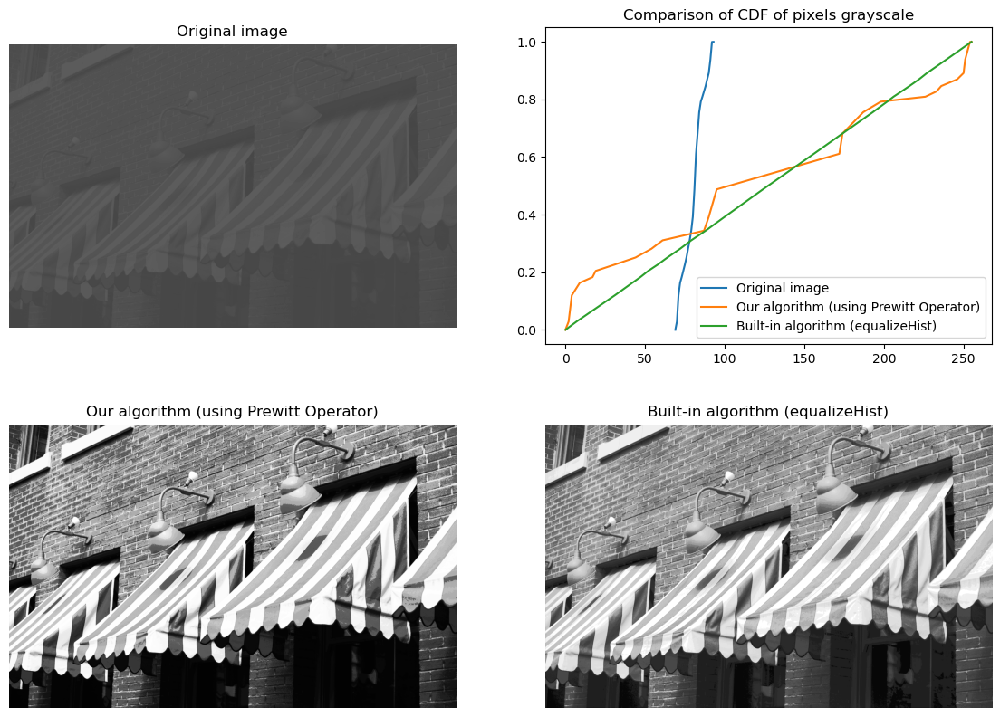

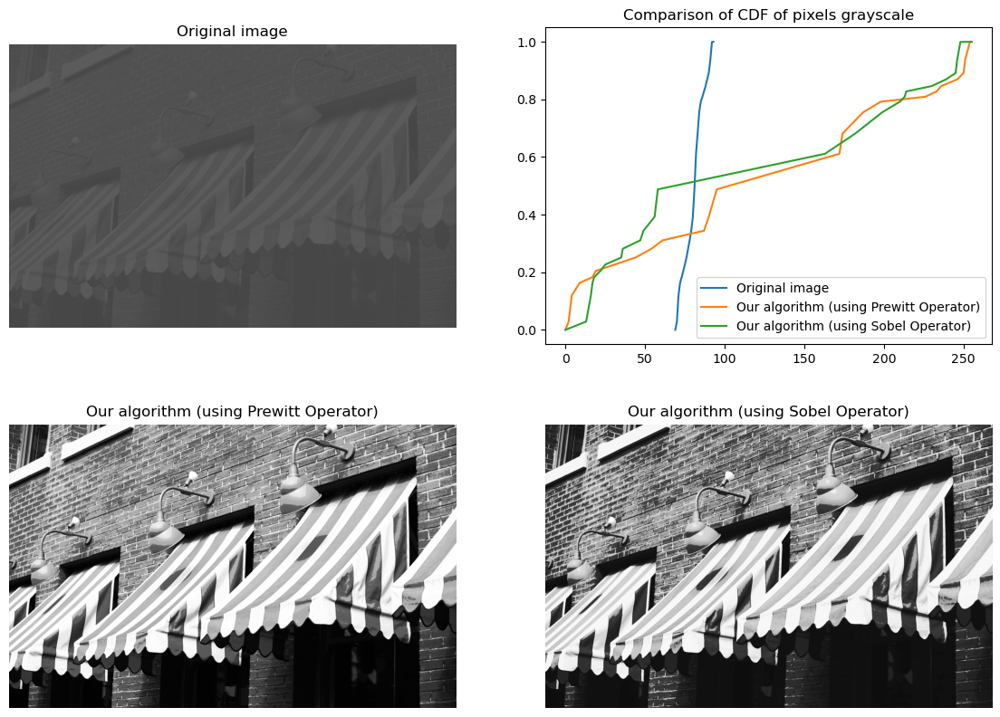

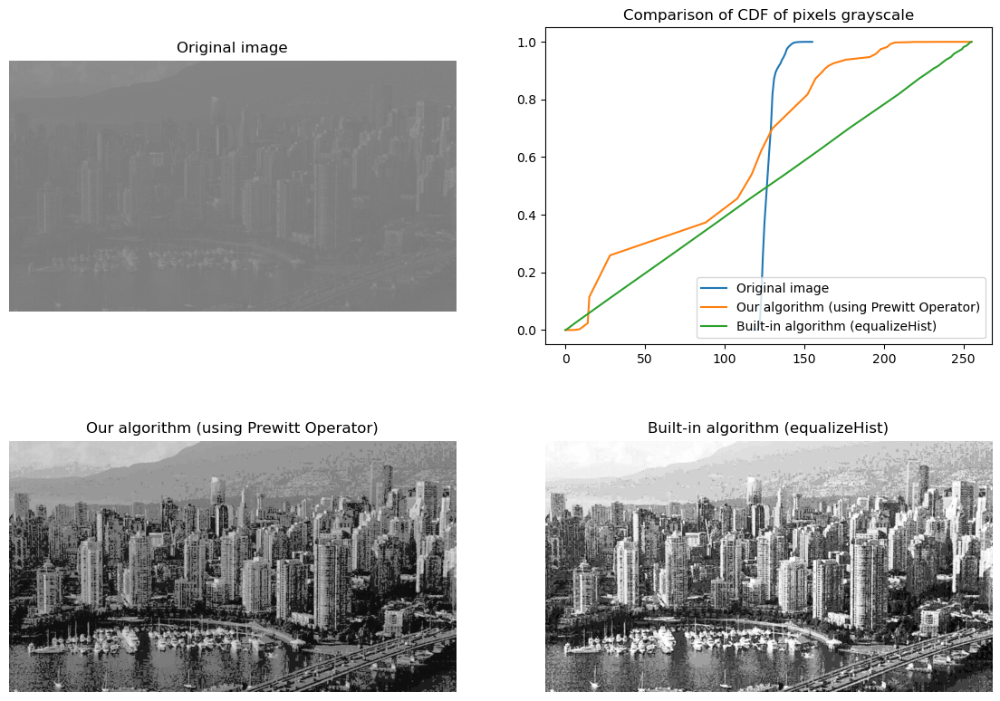

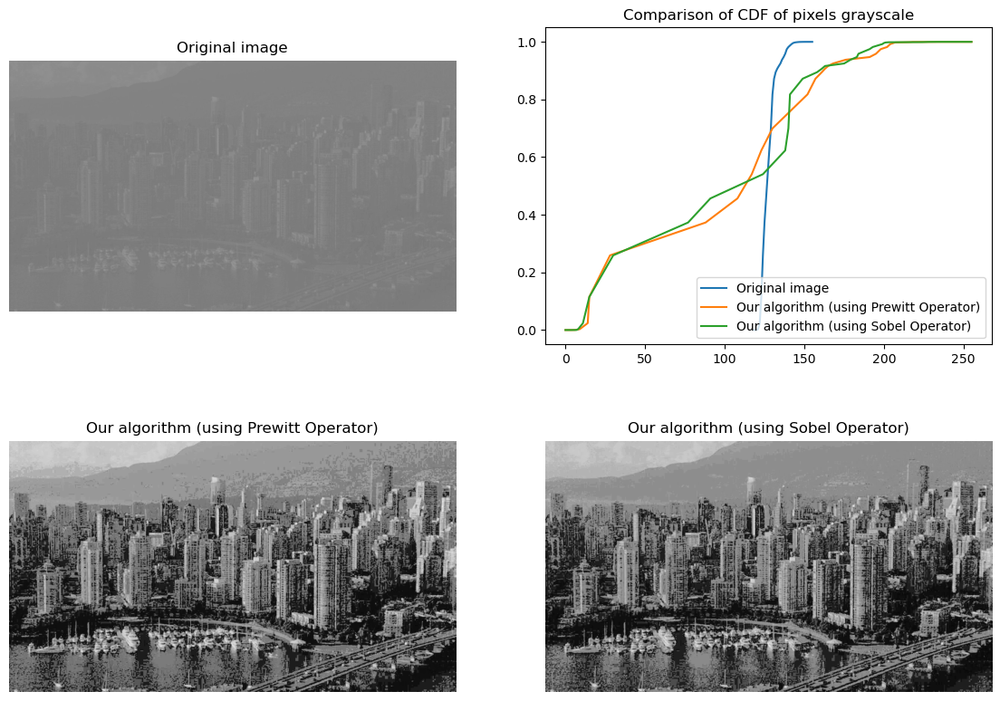

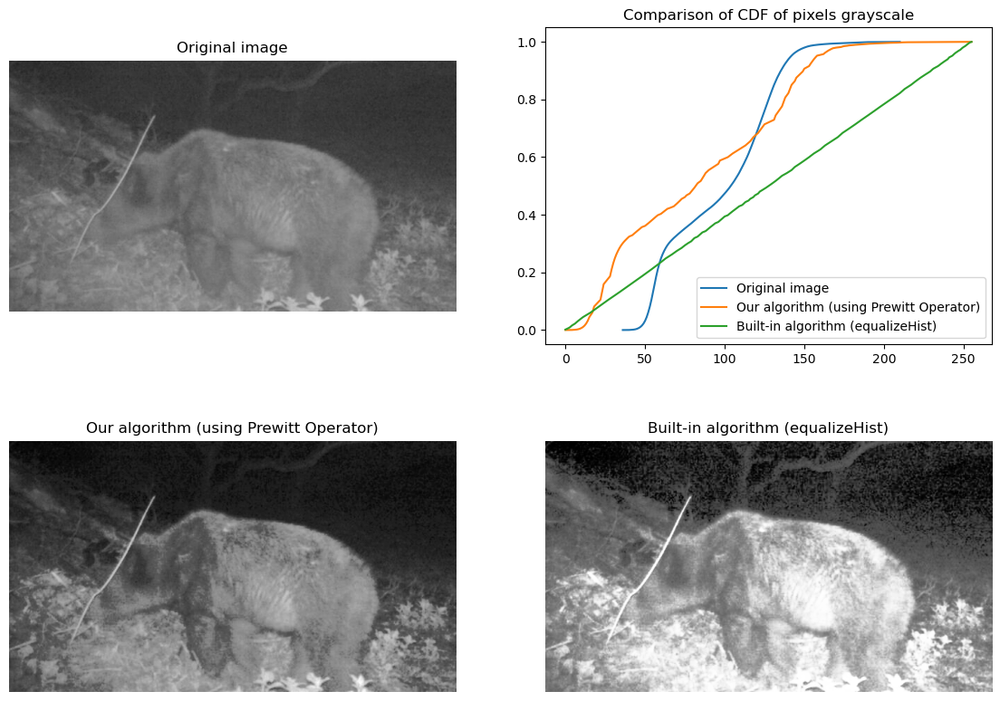

...

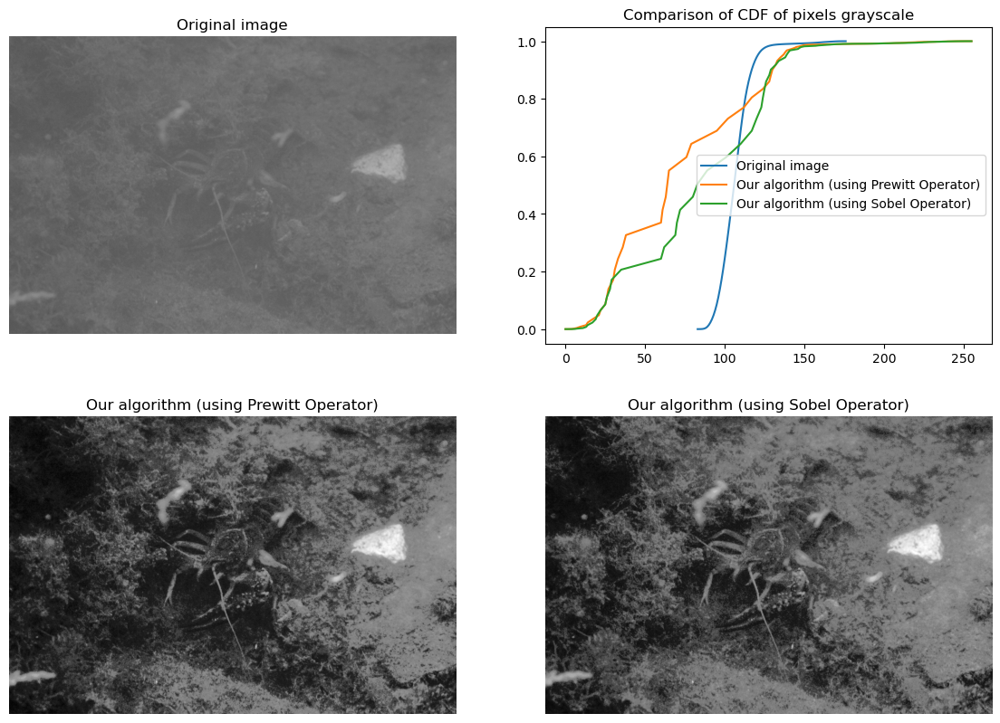

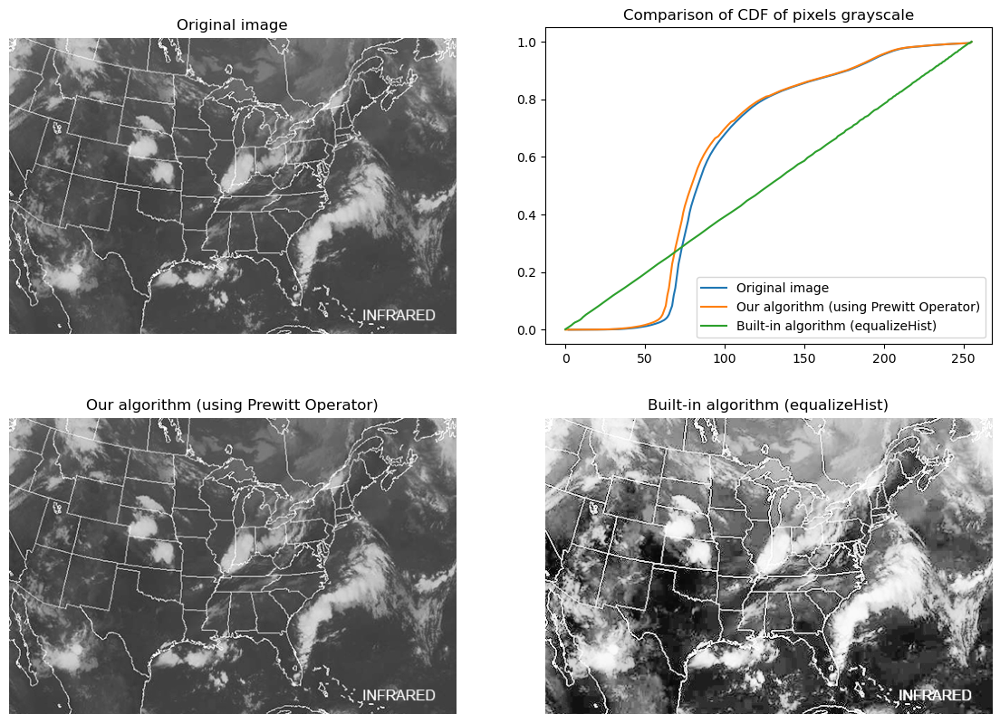

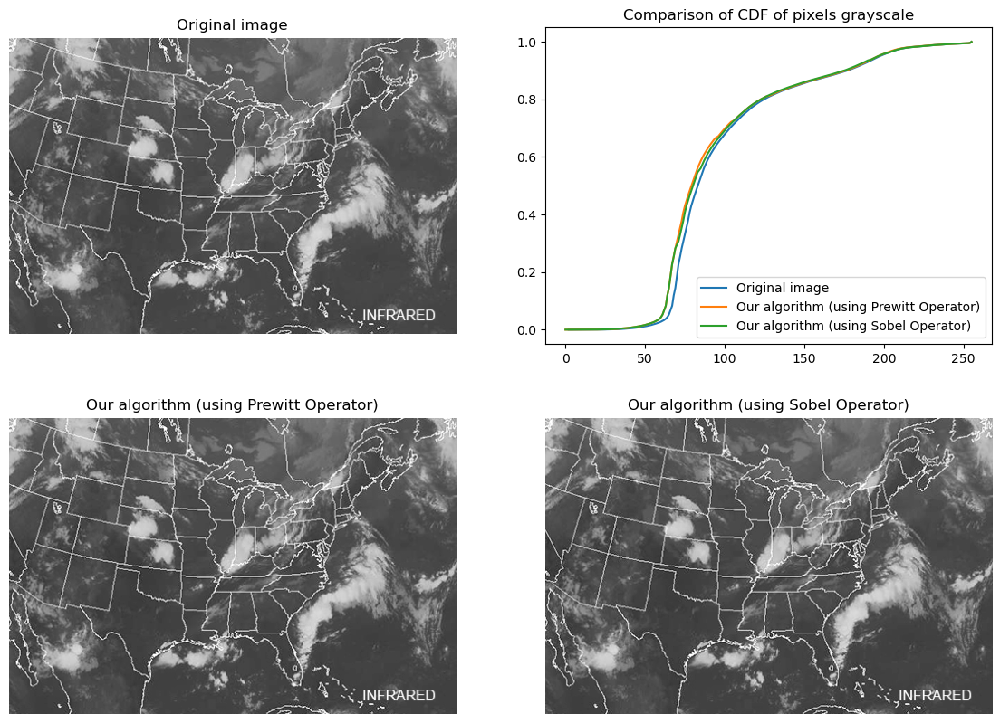

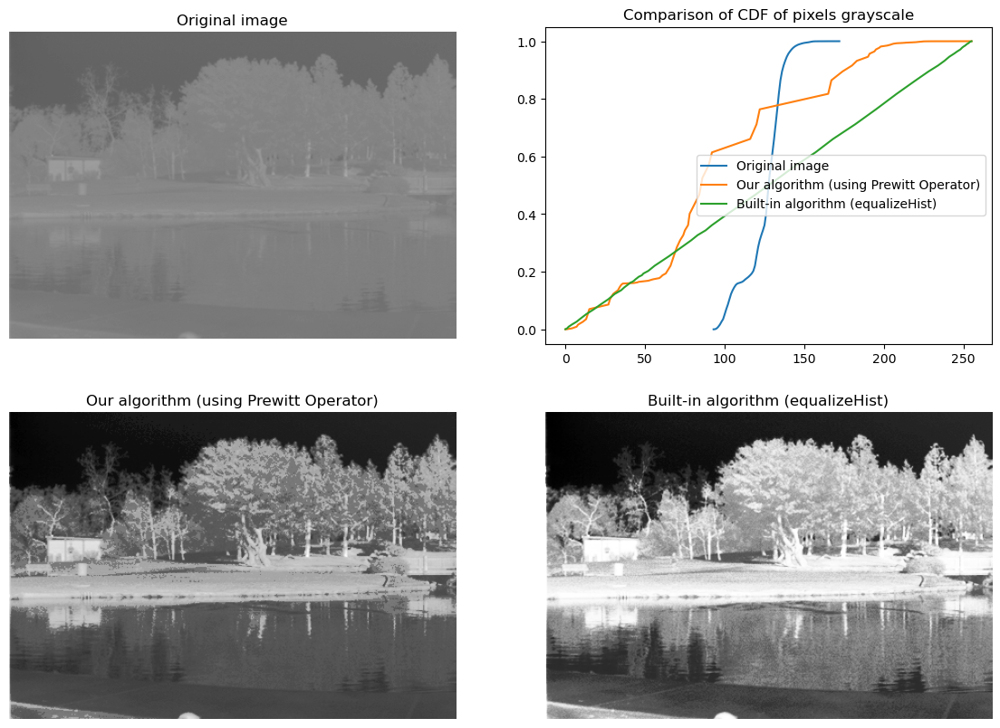

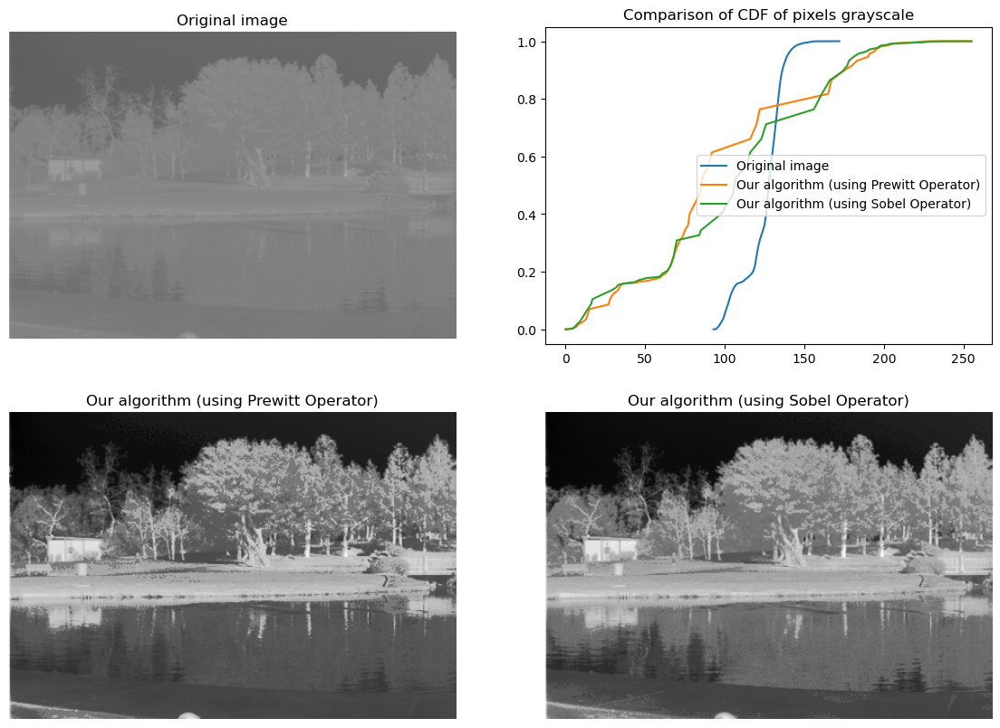

In [6]:
for image in images:
    ice_prewitt = ImageContrastEnhancement(image, "Prewitt", allow_duplicate_genes=False)
    ice_prewitt.run()

    ice_sobel = ImageContrastEnhancement(image, "Sobel", allow_duplicate_genes=False)
    ice_sobel.run()

    image_with_enhanced_contrast_our_algorithm_prewitt = ice_prewitt.image_generated_by_chromosome()
    image_with_enhanced_contrast_our_algorithm_sobel = ice_sobel.image_generated_by_chromosome()
    image_with_enhanced_contrast_equalizeHist = cv2.equalizeHist(image)
    plot_images_comparison(
        image,
        image_with_enhanced_contrast_our_algorithm_prewitt,
        image_with_enhanced_contrast_equalizeHist,
        "Original image",
        "Our algorithm (using Prewitt Operator)",
        "Built-in algorithm (equalizeHist)"
    )
    plt.show()
    plot_images_comparison(
        image,
        image_with_enhanced_contrast_our_algorithm_prewitt,
        image_with_enhanced_contrast_our_algorithm_sobel,
        "Original image",
        "Our algorithm (using Prewitt Operator)",
        "Our algorithm (using Sobel Operator)"
    )
    plt.show()

# time - 5 min